KUL H02A5a Computer Vision: Group Assignment 2
---------------------------------------------------------------
Student numbers: <span style="color:red">r1, r2, r3, r4, r5</span>. (fill in your student numbers!)

In this group assignment your team will delve into some deep learning applications for computer vision. The assignment will be delivered in the same groups from *Group assignment 1* and you start from this template notebook. The notebook you submit for grading is the last notebook pinned as default and submitted to the [Kaggle competition](https://www.kaggle.com/t/d11be6a431b84198bc85f54ae7e2563f) prior to the deadline on **Wednesday 22 May 23:59**. Closely follow [these instructions](https://github.com/gourie/kaggle_inclass) for joining the competition, sharing your notebook with the TAs and making a valid notebook submission to the competition. A notebook submission not only produces a *submission.csv* file that is used to calculate your competition score, it also runs the entire notebook and saves its output as if it were a report. This way it becomes an all-in-one-place document for the TAs to review. As such, please make sure that your final submission notebook is self-contained and fully documented (e.g. provide strong arguments for the design choices that you make). Most likely, this notebook format is not appropriate to run all your experiments at submission time (e.g. the training of CNNs is a memory hungry and time consuming process; due to limited Kaggle resources). It can be a good idea to distribute your code otherwise and only summarize your findings, together with your final predictions, in the submission notebook. For example, you can substitute experiments with some text and figures that you have produced "offline" (e.g. learning curves and results on your internal validation set or even the test set for different architectures, pre-processing pipelines, etc). We advise you to first go through the PDF of this assignment entirely before you really start. Then, it can be a good idea to go through this notebook and use it as your first notebook submission to the competition. You can make use of the *Group assignment 2* forum/discussion board on Toledo if you have any questions. Good luck and have fun!

---------------------------------------------------------------
NOTES:
* This notebook is just a template. Please keep the five main sections, but feel free to adjust further in any way you please!
* Clearly indicate the improvements that you make! You can for instance use subsections like: *3.1. Improvement: applying loss function f instead of g*.


# 1. Overview
This assignment consists of *three main parts* for which we expect you to provide code and extensive documentation in the notebook:
* Image classification (Sect. 2)
* Semantic segmentation (Sect. 3)
* Adversarial attacks (Sect. 4)

In the first part, you will train an end-to-end neural network for image classification. In the second part, you will do the same for semantic segmentation. For these two tasks we expect you to put a significant effort into optimizing performance and as such competing with fellow students via the Kaggle competition. In the third part, you will try to find and exploit the weaknesses of your classification and/or segmentation network. For the latter there is no competition format, but we do expect you to put significant effort in achieving good performance on the self-posed goal for that part. Finally, we ask you to reflect and produce an overall discussion with links to the lectures and "real world" computer vision (Sect. 5). It is important to note that only a small part of the grade will reflect the actual performance of your networks. However, we do expect all things to work! In general, we will evaluate the correctness of your approach and your understanding of what you have done that you demonstrate in the descriptions and discussions in the final notebook.

## 1.1 Deep learning resources
If you did not yet explore this in *Group assignment 1 (Sect. 2)*, we recommend using the TensorFlow and/or Keras library for building deep learning models. You can find a nice crash course [here](https://colab.research.google.com/drive/1UCJt8EYjlzCs1H1d1X0iDGYJsHKwu-NO).

In [9]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
import numpy as np
import pandas as pd
import tensorflow as tf
from matplotlib import pyplot as plt
import os
import cv2
from urllib import request
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import Model
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.losses import categorical_crossentropy
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Dense, Flatten, Conv2D, MaxPooling2D, Dropout
from tensorflow.keras import models, layers
from tensorflow.keras.optimizers import Adadelta
from tensorflow.keras.metrics import Precision, Recall
from keras import regularizers
from keras.layers import BatchNormalization
from sklearn.metrics import f1_score
from keras.callbacks import ModelCheckpoint


## 1.2 PASCAL VOC 2009
For this project you will be using the [PASCAL VOC 2009](http://host.robots.ox.ac.uk/pascal/VOC/voc2009/index.html) dataset. This dataset consists of colour images of various scenes with different object classes (e.g. animal: *bird, cat, ...*; vehicle: *aeroplane, bicycle, ...*), totalling 20 classes.

The training set contains 749 examples.


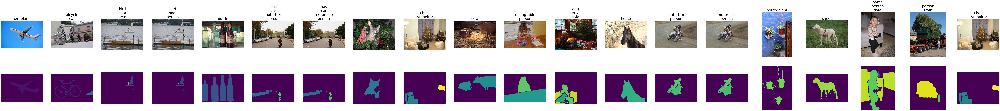

,aeroplane,bicycle,bird,boat,bottle,bus,car,cat,chair,cow,...,horse,motorbike,person,pottedplant,sheep,sofa,train,tvmonitor,img,seg
Id,,,,,,,,,,,,,,,,,,,,,
0,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,"[[[10, 8, 13], [16, 14, 19], [17, 14, 21], [19...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,..."


In [2]:
# Loading the training data
train_df = pd.read_csv('./data/train/train_set.csv', index_col="Id")
labels = train_df.columns
train_df["img"] = [np.load('./data/train/img/train_{}.npy'.format(idx)) for idx, _ in train_df.iterrows()]
train_df["seg"] = [np.load('./data/train/seg/train_{}.npy'.format(idx)) for idx, _ in train_df.iterrows()]
print("The training set contains {} examples.".format(len(train_df)))

# Show some examples
fig, axs = plt.subplots(2, 20, figsize=(10 * 20, 10 * 2))
for i, label in enumerate(labels):
    df = train_df.loc[train_df[label] == 1]
    axs[0, i].imshow(df.iloc[0]["img"], vmin=0, vmax=255)
    axs[0, i].set_title("\n".join(label for label in labels if df.iloc[0][label] == 1), fontsize=40)
    axs[0, i].axis("off")
    axs[1, i].imshow(df.iloc[0]["seg"], vmin=0, vmax=20)  # with the absolute color scale it will be clear that the arrays in the "seg" column are label maps (labels in [0, 20])
    axs[1, i].axis("off")
    
plt.show()

# The training dataframe contains for each image 20 columns with the ground truth classification labels and 20 column with the ground truth segmentation maps for each class
train_df.head(1)

In [3]:
# Loading the test data
test_df = pd.read_csv('./data/test/test_set.csv', index_col="Id")
test_df["img"] = [np.load('./data/test/img/test_{}.npy'.format(idx)) for idx, _ in test_df.iterrows()]
test_df["seg"] = [-1 * np.ones(img.shape[:2], dtype=np.int8) for img in test_df["img"]]
print("The test set contains {} examples.".format(len(test_df)))

# The test dataframe is similar to the training dataframe, but here the values are -1 --> your task is to fill in these as good as possible in Sect. 2 and Sect. 3; in Sect. 6 this dataframe is automatically transformed in the submission CSV!
test_df.head(1)

The test set contains 750 examples.


,aeroplane,bicycle,bird,boat,bottle,bus,car,cat,chair,cow,...,horse,motorbike,person,pottedplant,sheep,sofa,train,tvmonitor,img,seg
Id,,,,,,,,,,,,,,,,,,,,,
0,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,"[[[139, 130, 115], [136, 127, 112], [112, 102,...","[[-1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, ..."


In [ ]:
""" Keep for final submission
# Loading the training data
train_df = pd.read_csv('//kaggle/input/kul-h02a5a-computer-vision-ga2-2024/train/train_set.csv', index_col="Id")
labels = train_df.columns
train_df["img"] = [np.load('/kaggle/input/kul-h02a5a-computer-vision-ga2-2024/train/img/train_{}.npy'.format(idx)) for idx, _ in train_df.iterrows()]
train_df["seg"] = [np.load('/kaggle/input/kul-h02a5a-computer-vision-ga2-2024/train/seg/train_{}.npy'.format(idx)) for idx, _ in train_df.iterrows()]
print("The training set contains {} examples.".format(len(train_df)))

# Show some examples
fig, axs = plt.subplots(2, 20, figsize=(10 * 20, 10 * 2))
for i, label in enumerate(labels):
    df = train_df.loc[train_df[label] == 1]
    axs[0, i].imshow(df.iloc[0]["img"], vmin=0, vmax=255)
    axs[0, i].set_title("\n".join(label for label in labels if df.iloc[0][label] == 1), fontsize=40)
    axs[0, i].axis("off")
    axs[1, i].imshow(df.iloc[0]["seg"], vmin=0, vmax=20)  # with the absolute color scale it will be clear that the arrays in the "seg" column are label maps (labels in [0, 20])
    axs[1, i].axis("off")
    
plt.show()

# The training dataframe contains for each image 20 columns with the ground truth classification labels and 20 column with the ground truth segmentation maps for each class
train_df.head(1)
"""

In [ ]:
""" Keep for final submission
# Loading the test data
test_df = pd.read_csv('/kaggle/input/kul-h02a5a-computer-vision-ga2-2024/test/test_set.csv', index_col="Id")
test_df["img"] = [np.load('/kaggle/input/kul-h02a5a-computer-vision-ga2-2024/test/img/test_{}.npy'.format(idx)) for idx, _ in test_df.iterrows()]
test_df["seg"] = [-1 * np.ones(img.shape[:2], dtype=np.int8) for img in test_df["img"]]
print("The test set contains {} examples.".format(len(test_df)))

# The test dataframe is similar to the training dataframe, but here the values are -1 --> your task is to fill in these as good as possible in Sect. 2 and Sect. 3; in Sect. 6 this dataframe is automatically transformed in the submission CSV!
test_df.head(1)
"""

## 1.3 Your Kaggle submission
Your filled test dataframe (during Sect. 2 and Sect. 3) must be converted to a submission.csv with two rows per example (one for classification and one for segmentation) and with only a single prediction column (the multi-class/label predictions running length encoded). You don't need to edit this section. Just make sure to call this function at the right position in this notebook.

In [44]:
def _rle_encode(img):
    """
    Kaggle requires RLE encoded predictions for computation of the Dice score (https://www.kaggle.com/lifa08/run-length-encode-and-decode)

    Parameters
    ----------
    img: np.ndarray - binary img array
    
    Returns
    -------
    rle: String - running length encoded version of img
    """
    pixels = img.flatten()
    pixels = np.concatenate([[0], pixels, [0]])
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1
    runs[1::2] -= runs[::2]
    rle = ' '.join(str(x) for x in runs)
    return rle

def generate_submission(df):
    """
    Make sure to call this function once after you completed Sect. 2 and Sect. 3! It transforms and writes your test dataframe into a submission.csv file.
    
    Parameters
    ----------
    df: pd.DataFrame - filled dataframe that needs to be converted
    
    Returns
    -------
    submission_df: pd.DataFrame - df in submission format.
    """
    df_dict = {"Id": [], "Predicted": []}
    for idx, _ in df.iterrows():
        df_dict["Id"].append(f"{idx}_classification")
        df_dict["Predicted"].append(_rle_encode(np.array(df.loc[idx, labels])))
        df_dict["Id"].append(f"{idx}_segmentation")
        df_dict["Predicted"].append(_rle_encode(np.array([df.loc[idx, "seg"] == j + 1 for j in range(len(labels))])))
    
    submission_df = pd.DataFrame(data=df_dict, dtype=str).set_index("Id")
    submission_df.to_csv("submission.csv")
    return submission_df

# 2. Image classification
The goal here is simple: implement a classification CNN and train it to recognise all 20 classes (and/or background) using the training set and compete on the test set (by filling in the classification columns in the test dataframe).

In [4]:
class RandomClassificationModel:
    """
    Random classification model: 
        - generates random labels for the inputs based on the class distribution observed during training
        - assumes an input can have multiple labels
    """
    def fit(self, X, y):
        """
        Adjusts the class ratio variable to the one observed in y. 

        Parameters
        ----------
        X: list of arrays - n x (height x width x 3)
        y: list of arrays - n x (nb_classes)

        Returns
        -------
        self
        """
        self.distribution = np.mean(y, axis=0)
        print("Setting class distribution to:\n{}".format("\n".join(f"{label}: {p}" for label, p in zip(labels, self.distribution))))
        return self
        
    def predict(self, X):
        """
        Predicts for each input a label.
        
        Parameters
        ----------
        X: list of arrays - n x (height x width x 3)
            
        Returns
        -------
        y_pred: list of arrays - n x (nb_classes)
        """
        np.random.seed(0)
        return [np.array([int(np.random.rand() < p) for p in self.distribution]) for _ in X]
    
    def __call__(self, X):
        return self.predict(X)
    
model = RandomClassificationModel()
model.fit(train_df["img"], train_df[labels])
test_df.loc[:, labels] = model.predict(test_df["img"])
test_df.head(1)

Setting class distribution to:
aeroplane: 0.06275033377837116
bicycle: 0.0520694259012016
bird: 0.07343124165554073
boat: 0.06408544726301736
bottle: 0.056074766355140186
bus: 0.050734312416555405
car: 0.08411214953271028
cat: 0.06008010680907877
chair: 0.09212283044058744
cow: 0.04005340453938585
diningtable: 0.06408544726301736
dog: 0.05740987983978638
horse: 0.056074766355140186
motorbike: 0.06275033377837116
person: 0.27636849132176233
pottedplant: 0.05740987983978638
sheep: 0.036048064085447265
sofa: 0.05874499332443257
train: 0.0534045393858478
tvmonitor: 0.06809078771695594


,aeroplane,bicycle,bird,boat,bottle,bus,car,cat,chair,cow,...,horse,motorbike,person,pottedplant,sheep,sofa,train,tvmonitor,img,seg
Id,,,,,,,,,,,,,,,,,,,,,
0,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,1,0,0,0,"[[[139, 130, 115], [136, 127, 112], [112, 102,...","[[-1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, ..."


## Preprocessing

In [5]:

def resize_image(img, height, width):
    h = img.shape[0]
    w = img.shape[1]

    ratio = w/h
    resized = cv2.resize(img, (width, height), interpolation=cv2.INTER_CUBIC)
    """
    # Enable this and comment the previous line
    # for non-squared resizing
    
    if h <= w:
        #Horizontal orientation
        resized = cv2.resize(img, (width, height), interpolation=cv2.INTER_LINEAR)
    else:
        #Vertical orientation
        pixels_to_pad = width-int(height*ratio)
        resized = cv2.resize(img, (int(height*ratio), height), interpolation=cv2.INTER_LINEAR)
        if pixels_to_pad % 2 == 0:
            resized = cv2.copyMakeBorder(resized, 0, 0, pixels_to_pad//2, pixels_to_pad//2,
                                         cv2.BORDER_REPLICATE)
        else:
            resized = cv2.copyMakeBorder(resized, 0, 0, pixels_to_pad//2, pixels_to_pad//2+1,
                                         cv2.BORDER_REPLICATE)
    """
    return resized


def preprocess_data(X, y, shape, augment=True):
    """Resize and optionally augment the dataset
    In order to deal with class imbalance we only 
    augment the images that do not contain people.
    
    """
    height = shape[0]
    width = shape[1]
    X_res = []
    for i, img in enumerate(X):
        X_res.append(resize_image(img, height, width))

    X_res = np.array(X_res)

    if augment:
        to_augment = []
        to_augment_y = []
        people = []
        people_y = []
        for i, img in enumerate(X_res):
            if y[i][14] != 1:
                to_augment.append(img)
                to_augment_y.append(y[i])
            else:
                people.append(img)
                people_y.append(y[i])

        people = np.array(people)
        people_y = np.array(people_y)
        to_augment = np.array(to_augment)
        to_augment_y = np.array(to_augment_y)
    
        datagen = ImageDataGenerator(
                    rotation_range=20,
                    brightness_range=[0.3,1.0],
                    horizontal_flip=True)

        d = datagen.flow(to_augment, to_augment_y, batch_size=50, shuffle=False, seed=None)
        it = 0

        new = []
        new_y = []
        for batch in d:
            it += 1
            for i, img in enumerate(batch[0]):
                new.append(img)
                new_y.append(batch[1][i])
            if it >= 50:
                break

        new = np.array(new)
        new_y = np.array(new_y)
        
        data = np.concatenate((new, to_augment, people))
        data_y = np.concatenate((new_y, to_augment_y, people_y))
    else:
        data = X_res
        data_y = y

        
    return data, data_y

In [6]:
train_images = train_df["img"].to_numpy()
train_labels = train_df[labels].to_numpy()

IMG_SIZE = (224,224)

X, y = preprocess_data(train_images, train_labels, IMG_SIZE, augment=True)

X = X.astype(np.float32)

print("The augmented dataset contains", X.shape[0], "images")

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

print("Training set:", X_train.shape, y_train.shape)
print("Test set:", X_test.shape, y_test.shape)

The augmented dataset contains 3217 images
Training set: (2251, 224, 224, 3) (2251, 20)
Test set: (966, 224, 224, 3) (966, 20)


In [7]:
def show_image_with_label(data, labels):

    CLASSES = {'aeroplane': 0, 'bicycle': 1, 'bird': 2, 'boat': 3, 'bottle': 4, 'bus': 5,
            'car': 6, 'cat': 7, 'chair': 8, 'cow': 9, 'diningtable': 10, 'dog': 11,
            'horse': 12, 'motorbike':13, 'person': 14, 'pottedplant': 15, 'sheep': 16,
            'sofa': 17, 'train': 18, 'tvmonitor': 19}
    
    # Randomly select 10 indices
    indices = np.random.choice(len(labels), 10, replace=False)

    # Create a figure and axis objects
    fig, axes = plt.subplots(1, 10, figsize=(20, 2))  # Adjust figsize as needed

    # Show the selected 10 random images with their corresponding class names
    for i, idx in enumerate(indices):
        axes[i].imshow(data[idx].astype(np.uint8))
        
        # Get the class names for the labels with value 1
        class_names = [class_name for class_name, label in CLASSES.items() if labels[idx][label] == 1]
        
        # Set title as class names separated by commas
        axes[i].set_title(', '.join(class_names))
        
        axes[i].axis('off')

    plt.show()
    return 

def plot_history(history):
    fig, axs = plt.subplots(1, 3, figsize=(15, 5))  # Adjusting the layout to fit 3 plots

    # Summarize history for precision
    axs[0].plot(history.history['Precision'])  # Make sure the key matches your history dictionary
    axs[0].plot(history.history['val_Precision'])
    axs[0].set_title('Model Precision')
    axs[0].set_ylabel('Precision')
    axs[0].set_xlabel('Epoch')
    axs[0].legend(['Train', 'Validation'], loc='upper left')

    # Summarize history for loss
    axs[1].plot(history.history['loss'])
    axs[1].plot(history.history['val_loss'])
    axs[1].set_title('Model Loss')
    axs[1].set_ylabel('Loss')
    axs[1].set_xlabel('Epoch')
    axs[1].legend(['Train', 'Validation'], loc='upper left')

    # Summarize history for accuracy
    axs[2].plot(history.history['Accuracy'])  # Again, make sure the key matches your history dictionary
    axs[2].plot(history.history['val_Accuracy'])
    axs[2].set_title('Model Accuracy')
    axs[2].set_ylabel('Accuracy')
    axs[2].set_xlabel('Epoch')
    axs[2].legend(['Train', 'Validation'], loc='upper left')

    plt.tight_layout()  # This helps to fit everything into the figure cleanly
    plt.show()
    return

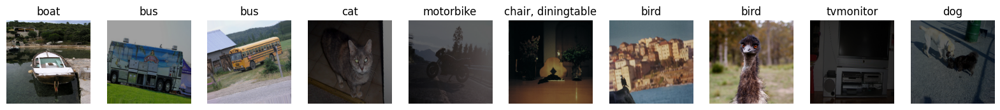

In [8]:
show_image_with_label(X_train, y_train)

## Basic CNN Model

## Known Model Architectures (Alexnet)

This section tries the well-known Alexnet architecture to classify images.

The architecture consists of the following layers:
* 5 convolutional layers for feature detection
* 3 maxpooling layers for reducing the dimension of feature maps
* 3 Fully connected layers to learn from the extracted features of the convolutional layers
* 1 flatten layer to transition from the convolutional layers to the fully connected layers
* 1 softmax output layer for multilabel classification

Reference: Krizhevsky, A., Sutskever, I., & Hinton, G.E. (2012). ImageNet classification with deep convolutional neural networks. Communications of the ACM, 60, 84 - 90.

### Full Alexnet Model


In [146]:
def get_alexnet_model(input_shape,nb_classes):
    input_shape = (input_shape[0], input_shape[1],3)
    
    model = models.Sequential(name="Alexnet")
    
    # Convolutional layers
    model.add(layers.Conv2D(filters=96, kernel_size=(11,11), input_shape=input_shape, strides=4, padding="valid", activation="relu", kernel_initializer="he_normal", use_bias=True))
    model.add(layers.MaxPool2D(pool_size=(3,3), strides=(2,2), padding="valid"))
    
    model.add(layers.Conv2D(filters=256, kernel_size=(5,5), strides=1, padding="same", activation="relu", kernel_initializer="he_normal", use_bias=True))
    model.add(layers.MaxPool2D(pool_size=(3,3), strides=(2,2), padding="valid"))
    
    model.add(layers.Conv2D(filters=384, kernel_size=(3,3), strides=1, activation="relu", padding="same", kernel_initializer="he_normal", use_bias=True))
    
    model.add(layers.Conv2D(filters=384, kernel_size=(3,3), strides=1, activation="relu", padding="same", kernel_initializer="he_normal", use_bias=True))
    
    model.add(layers.Conv2D(filters=256, kernel_size=(3,3), strides=1, activation="relu", padding="same", kernel_initializer="he_normal", use_bias=True))
    model.add(layers.MaxPool2D(pool_size=(3,3), strides=(2,2), padding="valid"))
    
    # Flatten layer
    model.add(layers.Flatten())
    
    # Fully connected layers
    model.add(layers.Dense(units=4096, activation="relu"))
    model.add(layers.Dense(units=4096, activation="relu"))
    model.add(layers.Dense(units=1000, activation="relu"))
    
    # Output layer
    model.add(layers.Dense(units=nb_classes, activation="softmax"))
    
    return model

def compile_alexnet_model():
    alexnet=get_alexnet_model((224,224),20)
    alexnet.compile(optimizer='adam', loss='binary_crossentropy', metrics=['Precision', 'Recall', 'Accuracy'])
    summary=alexnet.summary()
    print(summary)
    return alexnet

alexnet=compile_alexnet_model()

C:\Users\toont\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\keras\src\layers\convolutional\base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


Model: "Alexnet"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_56 (Conv2D)              │ (None, 54, 54, 96)     │        34,944 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_33 (MaxPooling2D) │ (None, 26, 26, 96)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_57 (Conv2D)              │ (None, 26, 26, 256)    │       614,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_34 (MaxPooling2D) │ (None, 12, 12, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_58 (Conv2D)              │ (None, 12, 12, 384)    │       885,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_59 (Conv2D)              │ (None, 12, 12, 384)    │     1,327,488 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_60 (Conv2D)              │ (None, 12, 12, 256)    │       884,992 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_35 (MaxPooling2D) │ (None, 5, 5, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_11 (Flatten)            │ (None, 6400)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_44 (Dense)                │ (None, 4096)           │    26,218,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_45 (Dense)                │ (None, 4096)           │    16,781,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_46 (Dense)                │ (None, 1000)           │     4,097,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_47 (Dense)                │ (None, 20)             │        20,020 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 50,864,028 (194.03 MB)

 Trainable params: 50,864,028 (194.03 MB)

 Non-trainable params: 0 (0.00 B)

None


In [164]:
history_alexnet=alexnet.fit(X_train, y_train, epochs=15, batch_size=64, validation_split=0.2)

Epoch 1/15
29/29 ━━━━━━━━━━━━━━━━━━━━ 111s 4s/step - Accuracy: 0.0503 - Precision: 0.0675 - Recall: 0.0275 - loss: 152.1394 - val_Accuracy: 0.0510 - val_Precision: 0.0000e+00 - val_Recall: 0.0000e+00 - val_loss: 0.3635
Epoch 2/15
29/29 ━━━━━━━━━━━━━━━━━━━━ 108s 4s/step - Accuracy: 0.0867 - Precision: 0.0435 - Recall: 6.4604e-04 - loss: 0.2903 - val_Accuracy: 0.0488 - val_Precision: 0.0000e+00 - val_Recall: 0.0000e+00 - val_loss: 0.2750
Epoch 3/15
29/29 ━━━━━━━━━━━━━━━━━━━━ 104s 4s/step - Accuracy: 0.1017 - Precision: 0.1191 - Recall: 0.0017 - loss: 0.2467 - val_Accuracy: 0.1220 - val_Precision: 0.0000e+00 - val_Recall: 0.0000e+00 - val_loss: 0.2407
Epoch 4/15
29/29 ━━━━━━━━━━━━━━━━━━━━ 113s 4s/step - Accuracy: 0.1336 - Precision: 0.2698 - Recall: 0.0029 - loss: 0.2307 - val_Accuracy: 0.1264 - val_Precision: 1.0000 - val_Recall: 0.0018 - val_loss: 0.2401
Epoch 5/15
29/29 ━━━━━━━━━━━━━━━━━━━━ 99s 3s/step - Accuracy: 0.1412 - Precision: 0.3213 - Recall: 0.0080 - loss: 0.2255 - val_Accurac

### Reduced Alexnet Model

Since the full Alexnet architecture contains more than 50 million parameters, this is too extensive to train from scratch and overfit it on the limited training data available. For this reason, a reduced version of the Alexnet architecture was trained from scratch. The reduced Alexnet model has the same structure, but with fewer filters for each convolutional layer, and fewer units for each dense layer. This reduces the number of trainable parameters to 8.6 million.

In addition, batch normalisation was added after each convolutional and fully connected layer. Thanks to the normalization of the outputs of the previous layer, the learning is sped up, the noise in the model is reduced and a higher learning rate can be used.

The model was trained in 100 epochs, using the Adam optimizer. This results in a training accuracy of x and a validation accuracy of x.

reference: Saxena, S. (2024, 20 februari). Introduction to Batch Normalization. Analytics Vidhya. https://www.analyticsvidhya.com/blog/2021/03/introduction-to-batch-normalization/

In [10]:
from keras import regularizers
from keras.layers import BatchNormalization
from keras.callbacks import ModelCheckpoint


def get_alexnet_model_reduced(input_shape, nb_classes):
    input_shape = (input_shape[0], input_shape[1],3)
    model = models.Sequential(name="Alexnet")
    
    # Convolutional layers
    model.add(layers.Conv2D(filters=16, kernel_size=(11,11), input_shape=input_shape, strides=4, padding="valid", kernel_initializer="he_normal", use_bias=False))
    model.add(BatchNormalization())
    model.add(layers.Activation("relu"))
    model.add(layers.MaxPool2D(pool_size=(3,3), strides=(2,2), padding="valid"))
    
    model.add(layers.Conv2D(filters=32, kernel_size=(5,5), strides=1, padding="same", kernel_initializer="he_normal", use_bias=False))
    model.add(BatchNormalization())
    model.add(layers.Activation("relu"))
    model.add(layers.MaxPool2D(pool_size=(3,3), strides=(2,2), padding="valid"))
    
    model.add(layers.Conv2D(filters=64, kernel_size=(3,3), strides=1, padding="same", kernel_initializer="he_normal", use_bias=False))
    model.add(BatchNormalization())
    model.add(layers.Activation("relu"))
    
    model.add(layers.Conv2D(filters=64, kernel_size=(3,3), strides=1, padding="same", kernel_initializer="he_normal", use_bias=False))
    model.add(BatchNormalization())
    model.add(layers.Activation("relu"))
    
    model.add(layers.Conv2D(filters=64, kernel_size=(3,3), strides=1, padding="same", kernel_initializer="he_normal", use_bias=False))
    model.add(BatchNormalization())
    model.add(layers.Activation("relu"))
    model.add(layers.MaxPool2D(pool_size=(3,3), strides=(2,2), padding="valid"))
    
    # Flatten layer
    model.add(layers.Flatten())
    
    # Fully connected layers
    model.add(layers.Dense(units=2048))
    model.add(BatchNormalization())
    model.add(layers.Activation("relu"))
    
    model.add(layers.Dense(units=2048))
    model.add(BatchNormalization())
    model.add(layers.Activation("relu"))
    
    model.add(layers.Dense(units=500))
    model.add(BatchNormalization())
    model.add(layers.Activation("relu"))
    
    # Output layer
    model.add(layers.Dense(units=nb_classes, activation="softmax"))
    
    return model

def compile_alexnet_model_reduced():
    alexnet_reduced=get_alexnet_model_reduced((224,224),20)
    filepath = "best_model.keras"

    # Define the checkpoint to monitor validation accuracy and save the best model
    checkpoint = ModelCheckpoint(filepath, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')

    alexnet_reduced.compile(optimizer='adam', loss='binary_crossentropy', metrics=['Precision', 'Recall', 'Accuracy'])
    summary=alexnet_reduced.summary()
    print(summary)
    return alexnet_reduced

alexnet_reduced=compile_alexnet_model_reduced()

C:\Users\toont\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\keras\src\layers\convolutional\base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


Model: "Alexnet"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 54, 54, 16)     │         5,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 54, 54, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 54, 54, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 26, 26, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 26, 26, 32)     │        12,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 26, 26, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_1 (Activation)       │ (None, 26, 26, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 12, 12, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 12, 12, 64)     │        18,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 12, 12, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_2 (Activation)       │ (None, 12, 12, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 12, 12, 64)     │        36,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 12, 12, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_3 (Activation)       │ (None, 12, 12, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 12, 12, 64)     │        36,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 12, 12, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_4 (Activation)       │ (None, 12, 12, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 5, 5, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 1600)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 2048)           │     3,278,848 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 2048)           │         8,192 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_5 (Activation)       │ (None, 2048)           │             

 Total params: 8,639,832 (32.96 MB)

 Trainable params: 8,630,160 (32.92 MB)

 Non-trainable params: 9,672 (37.78 KB)

None


In [12]:
# Define the ModelCheckpoint callback
checkpoint_callback = ModelCheckpoint(
    'alexnet_reduced_best.keras',              # Path where the model will be saved
    monitor='val_Accuracy',       # Metric to monitor
    save_best_only=True,          # Save only the best model
    mode='max',                   # Mode 'max' because we aim to maximize the validation accuracy
    verbose=1                     # Logs out when models are being saved
)

history_alexnet_reduced=alexnet_reduced.fit(X_train, y_train, epochs=100, batch_size=16, validation_split=0.2,callbacks=[checkpoint_callback])

Epoch 1/100
113/113 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - Accuracy: 0.8858 - Precision: 0.9941 - Recall: 0.8057 - loss: 0.0040
Epoch 1: val_Accuracy improved from -inf to 0.67184, saving model to alexnet_reduced_best.keras
113/113 ━━━━━━━━━━━━━━━━━━━━ 10s 90ms/step - Accuracy: 0.8857 - Precision: 0.9941 - Recall: 0.8056 - loss: 0.0040 - val_Accuracy: 0.6718 - val_Precision: 0.7696 - val_Recall: 0.5849 - val_loss: 0.1866
Epoch 2/100
113/113 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - Accuracy: 0.8800 - Precision: 0.9885 - Recall: 0.7933 - loss: 0.0073
Epoch 2: val_Accuracy improved from 0.67184 to 0.67406, saving model to alexnet_reduced_best.keras
113/113 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step - Accuracy: 0.8800 - Precision: 0.9885 - Recall: 0.7933 - loss: 0.0073 - val_Accuracy: 0.6741 - val_Precision: 0.7483 - val_Recall: 0.5674 - val_loss: 0.1893
Epoch 3/100
113/113 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - Accuracy: 0.8671 - Precision: 0.9822 - Recall: 0.7796 - loss: 0.0104
Epoch 3: val_Accuracy did no

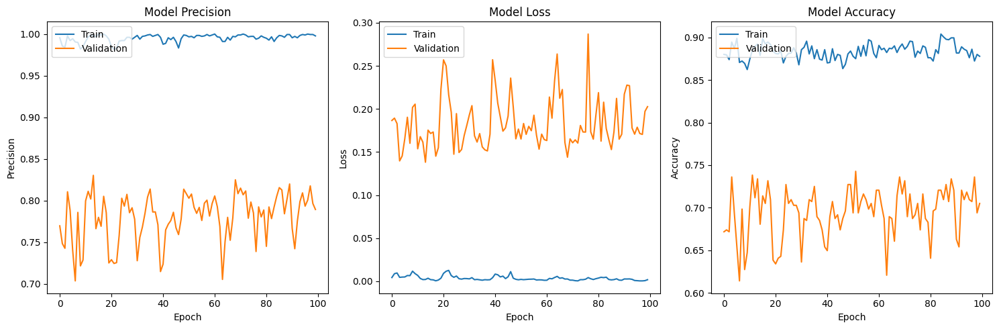

In [13]:
plot_history(history_alexnet_reduced)

In [14]:
from tensorflow.keras.models import load_model

# Load the best model
alexnet_reduced = load_model('alexnet_reduced_best.keras')



In [15]:
test_images = test_df["img"].to_numpy()
test_resized=[]
for im in test_images:
    resized = cv2.resize(im, (224, 224), interpolation=cv2.INTER_CUBIC)
    test_resized.append(resized)
test_resized=np.array(test_resized)

In [16]:
y_test_pred_tf = alexnet_reduced.predict(test_resized)
y_test_pred=np.where(y_test_pred_tf > 0.4, 1, 0)
test_df.loc[:, labels] = y_test_pred

24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step


By plotting the image of the test set, along with the label that the reduced Alexnet model is not yet performing optimally. We continue to look for improvements, this time by applying transfer learning.

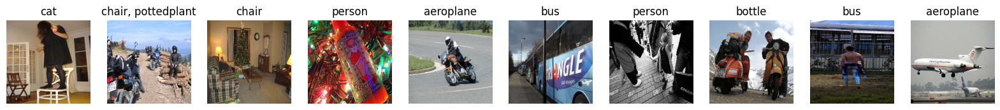

In [26]:
show_image_with_label(test_resized,y_test_pred)

## Transfer Learning

# 3. Semantic segmentation
The goal here is to implement a segmentation CNN that labels every pixel in the image as belonging to one of the 20 classes (and/or background). Use the training set to train your CNN and compete on the test set (by filling in the segmentation column in the test dataframe).

In [23]:
class RandomSegmentationModel:
    """
    Random segmentation model: 
        - generates random label maps for the inputs based on the class distributions observed during training
        - every pixel in an input can only have one label
    """
    def fit(self, X, Y):
        """
        Adjusts the class ratio variable to the one observed in Y. 

        Parameters
        ----------
        X: list of arrays - n x (height x width x 3)
        Y: list of arrays - n x (height x width)

        Returns
        -------
        self
        """
        self.distribution = np.mean([[np.sum(Y_ == i) / Y_.size for i in range(len(labels) + 1)] for Y_ in Y], axis=0)
        print("Setting class distribution to:\nbackground: {}\n{}".format(self.distribution[0], "\n".join(f"{label}: {p}" for label, p in zip(labels, self.distribution[1:]))))
        return self
        
    def predict(self, X):
        """
        Predicts for each input a label map.
        
        Parameters
        ----------
        X: list of arrays - n x (height x width x 3)
            
        Returns
        -------
        Y_pred: list of arrays - n x (height x width)
        """
        np.random.seed(0)
        return [np.random.choice(np.arange(len(labels) + 1), size=X_.shape[:2], p=self.distribution) for X_ in X]
    
    def __call__(self, X):
        return self.predict(X)
    
model = RandomSegmentationModel()
model.fit(train_df["img"], train_df["seg"])
test_df.loc[:, "seg"] = model.predict(test_df["img"])
test_df.head(1)

Setting class distribution to:
background: 0.7774704888071216
aeroplane: 0.007051912139390122
bicycle: 0.0030340461305405344
bird: 0.009781050583857026
boat: 0.007920222121661963
bottle: 0.00801371700061968
bus: 0.014444057783372053
car: 0.01299203192837253
cat: 0.016639155300546396
chair: 0.008264122763258911
cow: 0.006782009244183503
diningtable: 0.013744445666126768
dog: 0.0074080558785160075
horse: 0.008338953677311486
motorbike: 0.01079509937004467
person: 0.041013621147577735
pottedplant: 0.00539385590505006
sheep: 0.009157332163106574
sofa: 0.00958005931515607
train: 0.012118249521815817
tvmonitor: 0.010057513552370658


ValueError: setting an array element with a sequence. The requested array has an inhomogeneous shape after 1 dimensions. The detected shape was (750,) + inhomogeneous part.

In [24]:
class VGGEncoderTransposeConvDecoder(RandomSegmentationModel):
## Encoder is based on pre-trained VGG model for ImageNet
## Decoder are deconvolution layers
## Encoder is freezed during training
## basic data augentation by flipping images horizontally
## basic weights to classes
## No fine-tuning (yet)
## Based on https://www.tensorflow.org/tutorials/images/segmentation
    def __init__(self, preprocess_image_size=(160,160)):
        self.image_size = preprocess_image_size
        self.train_split = 0.8 #Percentage of data in training set 
        self.training_epochs = 1
        
    
    # Define upsampler
    @staticmethod
    def upsample(filters, size, apply_dropout=False):
        
        initializer = tf.random_normal_initializer(0., 0.02)

        result = tf.keras.Sequential()
        result.add(
        tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                        padding='same',
                                        kernel_initializer=initializer,
                                        use_bias=False))

        result.add(tf.keras.layers.BatchNormalization())

        if apply_dropout:
            result.add(tf.keras.layers.Dropout(0.5))

        result.add(tf.keras.layers.ReLU())
        
        return result
    
    def define_unet(self):
        # get encoder
        encoder_model = tf.keras.applications.VGG16(input_shape=self.image_size + (3,), include_top=False) #Don't include imageNet classifier
        # Use the activations of these layers
        layer_names = [
            'block1_pool',   # 80 x 80
            'block2_pool',   # 40 x 40
            'block3_pool',   # 20 x 20
            'block4_pool',  # 10 x 10
          'block5_pool',      # 5 x 5
        ]
        encoder_model_outputs = [encoder_model.get_layer(name).output for name in layer_names]
        down_stack = tf.keras.Model(inputs=encoder_model.input, outputs=encoder_model_outputs)

        down_stack.trainable = False    
        
        up_stack = [
            VGGEncoderTransposeConvDecoder.upsample(512, 3),  # 5x5 -> 10x10
            VGGEncoderTransposeConvDecoder.upsample(256, 3),  # 10x10 -> 20x20
            VGGEncoderTransposeConvDecoder.upsample(128, 3),  # 20x20 -> 40x40
            VGGEncoderTransposeConvDecoder.upsample(64, 3),   # 40 x 40 -> 80x80
        ]
        # define unet
        inputs = tf.keras.layers.Input(shape=self.image_size + (3,))
        # Downsampling through the model
        skips = down_stack(inputs)
        x = skips[-1]
        skips = reversed(skips[:-1])
        
        # Upsampling and establishing the skip connections
        for up, skip in zip(up_stack, skips):
            x = up(x)
            concat = tf.keras.layers.Concatenate()
            x = concat([x, skip])
            
        # This is the last layer of the model
        last = tf.keras.layers.Conv2DTranspose(
              filters=21, kernel_size=3, strides=2,
              padding='same')

        x = last(x)
        
        self.unet = tf.keras.Model(inputs=inputs, outputs=x)
        self.unet.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])
        
        return self.unet
    
    def preprocess(self, X, Y=None, train=True):
        m_in = len(X)
        h, w = self.image_size
        m_out = 2*m_in if train else m_in
        X_train = np.zeros((m_out, h, w, 3), np.float32)
        if train:
            y_train = np.zeros((m_out, h, w), np.int8)

        for i in range(m_in):
            image = X[i] / 255.0 #Normalize inputs to [0, 1]
            image = cv2.resize(image, self.image_size)
            
            if train:
                mask = Y[i]
                mask = cv2.resize(mask, self.image_size,interpolation = cv2.INTER_NEAREST)

                X_train[2*i] = image
                X_train[2*i+1] = cv2.flip(image, 1) # Data augmentation
                y_train[2*i] = mask
                y_train[2*i+1] = cv2.flip(mask, 1)
                
            else:
                X_train[i] = image 
    
        if train:
            X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, train_size=self.train_split)
            
            ## Add weights
            W_train = np.zeros(y_train.shape)
            class_weights = tf.constant([1.0] + [10.0 for i in range(20)]) #Less focus on background
            class_weights = class_weights/tf.reduce_sum(class_weights)
            for j in range(len(W_train)):
                W_train[j] = tf.gather(class_weights, indices=tf.cast(y_train[i], tf.int32))
                
            return X_train, y_train, W_train, X_val, y_val
        
        else:
            return X_train

    
    def fit(self, X, Y):
        """
        Parameters
        ----------
        X: list of arrays - n x (height x width x 3)
        Y: list of arrays - n x (height x width)"""
        
        # preprocess
        X_train, y_train, W_train, X_val, y_val = self.preprocess(X, Y)
        
        # Define unet
        unet = self.define_unet()
        
        #Define callback to show a prediction on validation data during training
        class DisplayCallback(tf.keras.callbacks.Callback):
              def on_epoch_end(self, epoch, logs=None):
                    indices = [0]
                    for i in range(len(indices)):
                        pred = unet.predict(X_val[indices[i]:indices[i]+1])
                        pred = tf.math.argmax(pred, axis=-1)
                        plt.subplot(1, 3, 1)
                        plt.imshow(X_val[indices[i]])
                        plt.subplot(1, 3, 2)
                        plt.imshow(y_val[indices[i]],vmin=0, vmax=20)
                        plt.subplot(1, 3, 3)
                        plt.imshow(pred[0],vmin=0, vmax=20)
                        plt.axis('off')
                        plt.show()
                    print ('\nSample Prediction after epoch {}\n'.format(epoch+1))
        # train
        self.model_history = self.unet.fit(X_train, y_train, epochs=self.training_epochs,
                          validation_data = (X_val, y_val),
                          sample_weight = W_train,
                          callbacks=[DisplayCallback()])
        
    def predict(self, X):
        """
        Predicts for each input a label map.

        Parameters
        ----------
        X: list of arrays - n x (height x width x 3)

        Returns
        -------
        Y_pred: list of arrays - n x (height x width)
        """

        m = len(X)
        # Preprocess
        X_test = self.preprocess(X, train=False)
        
        # predict
        Y_test = self.unet.predict(X_test)
        Y_test = tf.math.argmax(Y_test, axis=-1)
        Y_test = Y_test[..., tf.newaxis].numpy()
        
        ## Post-process
        Y_pred = []
        for i in range(m):
            h, w = X[i].shape[:2]
            Y_pred.append(cv2.resize(Y_test[i], (w, h),interpolation = cv2.INTER_NEAREST))
    
        return Y_pred

In [25]:
image_size= (160, 160)
model = VGGEncoderTransposeConvDecoder(image_size)



58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 11s 0us/step
Epoch 1/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step- accuracy: 0.4672 - loss: 0.03


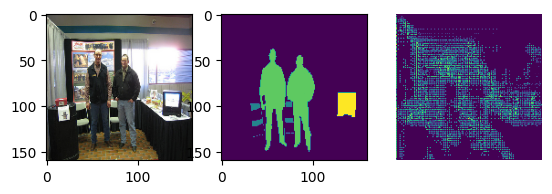


Sample Prediction after epoch 1

38/38 ━━━━━━━━━━━━━━━━━━━━ 133s 3s/step - accuracy: 0.4723 - loss: 0.0322 - val_accuracy: 0.6646 - val_loss: 1.7177
Epoch 2/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step- accuracy: 0.7772 - loss: 0.02


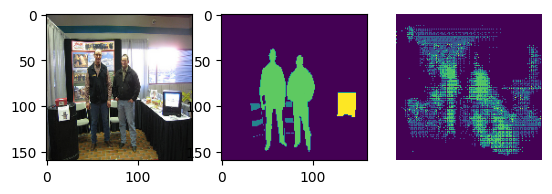


Sample Prediction after epoch 2

38/38 ━━━━━━━━━━━━━━━━━━━━ 172s 5s/step - accuracy: 0.7773 - loss: 0.0202 - val_accuracy: 0.6795 - val_loss: 1.6221
Epoch 3/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step- accuracy: 0.7794 - loss: 0.01


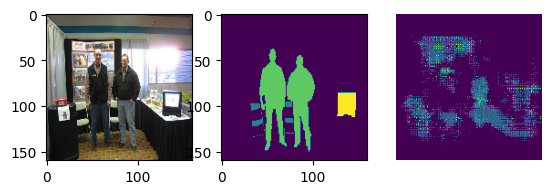


Sample Prediction after epoch 3

38/38 ━━━━━━━━━━━━━━━━━━━━ 181s 5s/step - accuracy: 0.7795 - loss: 0.0184 - val_accuracy: 0.7445 - val_loss: 1.2313
Epoch 4/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step- accuracy: 0.7915 - loss: 0.01


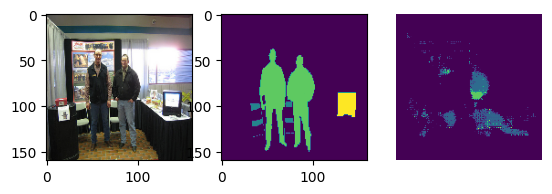


Sample Prediction after epoch 4

38/38 ━━━━━━━━━━━━━━━━━━━━ 191s 5s/step - accuracy: 0.7915 - loss: 0.0158 - val_accuracy: 0.7745 - val_loss: 1.0239
Epoch 5/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step- accuracy: 0.8000 - loss: 0.01


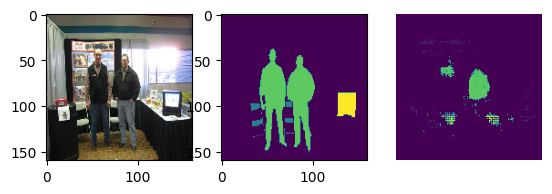


Sample Prediction after epoch 5

38/38 ━━━━━━━━━━━━━━━━━━━━ 212s 6s/step - accuracy: 0.7999 - loss: 0.0142 - val_accuracy: 0.7855 - val_loss: 0.9225
Epoch 6/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step- accuracy: 0.7979 - loss: 0.01


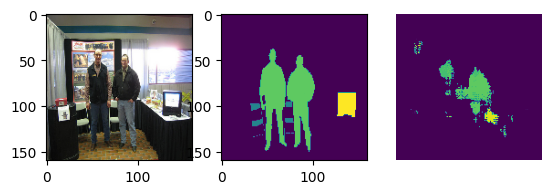


Sample Prediction after epoch 6

38/38 ━━━━━━━━━━━━━━━━━━━━ 201s 5s/step - accuracy: 0.7981 - loss: 0.0135 - val_accuracy: 0.7828 - val_loss: 0.8856
Epoch 7/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step- accuracy: 0.8110 - loss: 0.01


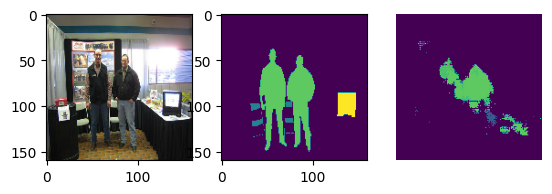


Sample Prediction after epoch 7

38/38 ━━━━━━━━━━━━━━━━━━━━ 190s 5s/step - accuracy: 0.8109 - loss: 0.0122 - val_accuracy: 0.7925 - val_loss: 0.8473
Epoch 8/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step- accuracy: 0.8159 - loss: 0.01


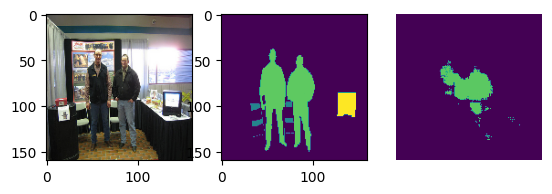


Sample Prediction after epoch 8

38/38 ━━━━━━━━━━━━━━━━━━━━ 189s 5s/step - accuracy: 0.8159 - loss: 0.0117 - val_accuracy: 0.7968 - val_loss: 0.8282
Epoch 9/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step- accuracy: 0.8104 - loss: 0.01


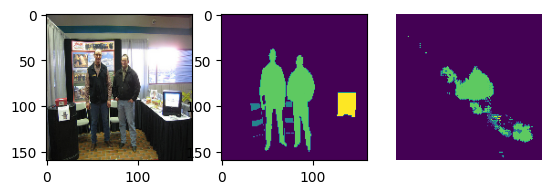


Sample Prediction after epoch 9

38/38 ━━━━━━━━━━━━━━━━━━━━ 186s 5s/step - accuracy: 0.8107 - loss: 0.0112 - val_accuracy: 0.8025 - val_loss: 0.7871
Epoch 10/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step- accuracy: 0.8327 - loss: 0.00


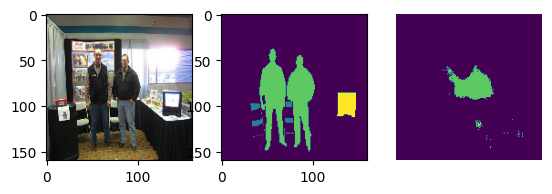


Sample Prediction after epoch 10

38/38 ━━━━━━━━━━━━━━━━━━━━ 188s 5s/step - accuracy: 0.8326 - loss: 0.0098 - val_accuracy: 0.7984 - val_loss: 0.8812


In [26]:
model.training_epochs = 10
model.fit(train_df["img"], train_df["seg"])

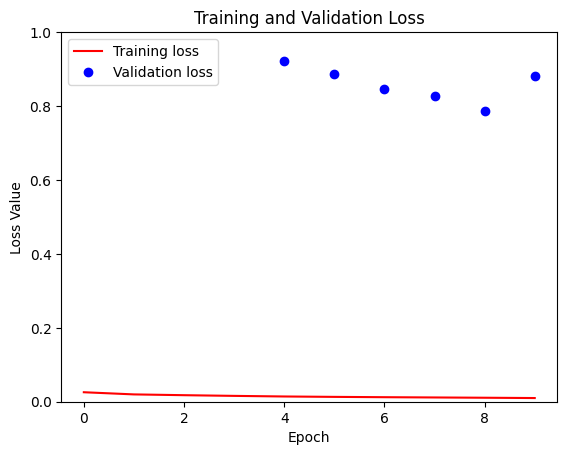

In [28]:
loss = model.model_history.history['loss']
val_loss = model.model_history.history['val_loss']

plt.figure()
plt.plot(model.model_history.epoch, loss, 'r', label='Training loss')
plt.plot(model.model_history.epoch, val_loss, 'bo', label='Validation loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss Value')
plt.ylim([0, 1])
plt.legend()
plt.show()

In [29]:
X_test = test_df["img"]
Y_pred = model(X_test)

Y_pred_train = train_df["img"]
Y_pred_train = model(Y_pred_train)

24/24 ━━━━━━━━━━━━━━━━━━━━ 77s 3s/step
24/24 ━━━━━━━━━━━━━━━━━━━━ 74s 3s/step


In [30]:
# Write to submission
test_df["seg"] = Y_pred

In [31]:
def show_predictions(X, Y_pred, indices, ground_truth=None):
    m = len(indices)
    f = 2 if ground_truth is None else 3
    for i in range(m):
        plt.subplot(m, f, i*f+1)
        plt.imshow(X[indices[i]])
        plt.subplot(m, f, i*f+2)
        plt.imshow(Y_pred[indices[i]],vmin=0, vmax=20)
        if ground_truth is not None:
            plt.subplot(m, f, i*f+3)
            plt.imshow(ground_truth[indices[i]],vmin=0, vmax=20)
    plt.axis('off')
    plt.show()

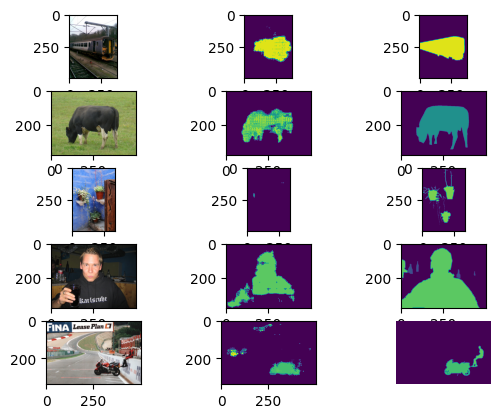

In [32]:
show_predictions(train_df["img"], Y_pred_train, [10, 11, 12, 13, 14], train_df["seg"])

In [ ]:
show_predictions(X_test, Y_pred, [7, 8, 9])

## Submit to competition
You don't need to edit this section. Just use it at the right position in the notebook. See the definition of this function in Sect. 1.3 for more details.

In [33]:
generate_submission(test_df)

,Predicted
Id,
0_classification,20 1
0_segmentation,
1_classification,9 1 18 1
1_segmentation,128583 3 129083 3 129583 3 130070 3 130083 6 1...
2_classification,3 1
...,...
747_segmentation,471608 3 472108 3 490126 4 490626 4 491126 4 4...
748_classification,17 1
748_segmentation,2708198 3 2708698 3 2709198 3 2710698 3 271119...


# 4. Adversarial attack
For this part, your goal is to fool your classification and/or segmentation CNN, using an *adversarial attack*. More specifically, the goal is build a CNN to perturb test images in a way that (i) they look unperturbed to humans; but (ii) the CNN classifies/segments these images in line with the perturbations.

# 5. Discussion
Finally, take some time to reflect on what you have learned during this assignment. Reflect and produce an overall discussion with links to the lectures and "real world" computer vision.